# **Dimensionality Reduction and Representation**

## **1. Introduction**

High-energy physics datasets are typically characterized by a large number of correlated input features.
While supervised classifiers aim to directly optimize signal–background separation, understanding the
structure of the feature space itself remains an important step in any analysis.

**Principal Component Analysis (PCA)** is a widely used dimensionality reduction technique that transforms
the original feature space into a set of orthogonal components ordered by decreasing variance.
Unlike supervised methods, PCA does not use class labels and therefore provides an unsupervised view
of the data representation.

In this notebook, PCA is employed as a representation and visualization tool to study the structure
of the dataset and to motivate the use of more expressive supervised classifiers in subsequent analyses.


## **2. Dataset and Feature Representation**

We use the same dataset and feature set introduced in the previous analysis.\
All numerical features are considered, excluding identifiers and target labels.

In [1]:
import sys
from pathlib import Path

PROJECT_ROOT = Path().resolve().parent
SRC_PATH = PROJECT_ROOT / "Preprocessing"

sys.path.append(str(SRC_PATH))

In [2]:
from data_preprocessing import load_clean_data
from data_preprocessing import make_preprocessor

X, y, w = load_clean_data()

Since PCA is used here purely as an exploratory tool and does not involve supervised training or model selection, it is applied to the full dataset.

## **3. Feature Scaling**

Principal Component Analysis is sensitive to the relative scale of the input features. Since PCA is based on the covariance structure of the data, features with larger numerical ranges would dominate the principal components if the data were not properly scaled.

In high-energy physics datasets, input features often represent different physical quantities (e.g. momenta, angles, masses) with inherently different units and magnitudes. Therefore, standardizing the features to zero mean and unit variance is a necessary preprocessing step before applying PCA.

In this analysis, all features are standardized using a z-score transformation.

In [3]:
imputer, scaler = make_preprocessor()

X = scaler.fit_transform(imputer.fit_transform(X))

After standardization, all features contribute equally to the PCA transformation. This ensures that the extracted principal components reflect correlations in the data rather than arbitrary differences in feature scales.

## **4. Principal Component Analysis (PCA)**

### **4.1 Conceptual Overview**

**Principal Component Analysis (PCA)** is an **unsupervised linear transformation** that projects the original feature space onto a new set of **orthogonal axes**, referred to as **principal components**.

Each principal component is defined as a **linear combination of the original features** and is constructed such that:

- **The first principal component** captures the **maximum possible variance** present in the data.  
- **Each subsequent component** captures the **maximum remaining variance**, subject to being **orthogonal** to all previously defined components.

From a **geometric perspective**, PCA can be interpreted as a **rotation of the feature space** that aligns the coordinate axes with the **directions of largest variance**.  
Importantly, **PCA does not make use of class labels** and therefore provides a **purely data-driven representation** of the underlying structure of the dataset.

In **high-energy physics analyses**, PCA is commonly used to:

- **Diagnose correlations** between input observables.  
- **Reduce the effective dimensionality** of the feature space.  
- **Visualize the structure** of signal and background events in a **lower-dimensional representation**.  
- **Motivate or validate** the use of more complex **supervised classifiers**.

In this notebook, PCA is employed primarily as an **exploratory and representational tool**, rather than as a **classification method**.


### **4.2 Applying PCA**

After standardizing the input features, Principal Component Analysis (PCA) is applied to the dataset in order to construct a new orthogonal basis in feature space.

At this stage, PCA is used to analyze the **full variance structure** of the data. Therefore, no explicit restriction is placed on the number of retained components. This allows us to examine how variance is distributed across the principal components before making any dimensionality reduction decisions.

In [4]:
from sklearn.decomposition import PCA

pca = PCA()
X_pca = pca.fit_transform(X)

The transformation projects each event from the original feature space into the principal component space, where the components are ordered by decreasing explained variance.

This representation forms the basis for subsequent analyses of variance distribution and low-dimensional visualization, which will be discussed in the following sections.

## **5. Explained Variance Analysis**

After applying PCA to the standardized dataset, the next step is to analyze how the total variance of the data is distributed across the principal components.

The explained variance analysis provides quantitative insight into the effective dimensionality of the feature space. It allows us to assess whether the information content of the dataset is concentrated in a small number of directions or spread across many independent dimensions.

Understanding this structure is essential before interpreting PCA projections or considering dimensionality reduction for downstream tasks.

### **5.1 Explained Variance Ratio**

The explained variance ratio of a principal component is defined as the fraction of the total variance captured by that component alone.

Formally, it measures how much information each principal component contributes relative to the full dataset.

A rapidly decreasing variance spectrum indicates strong correlations among the original features, meaning that much of the variability can be described using a small number of components.
Conversely, a slowly decaying spectrum suggests that the information is distributed more evenly across many dimensions.

In [5]:
import numpy as np

explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

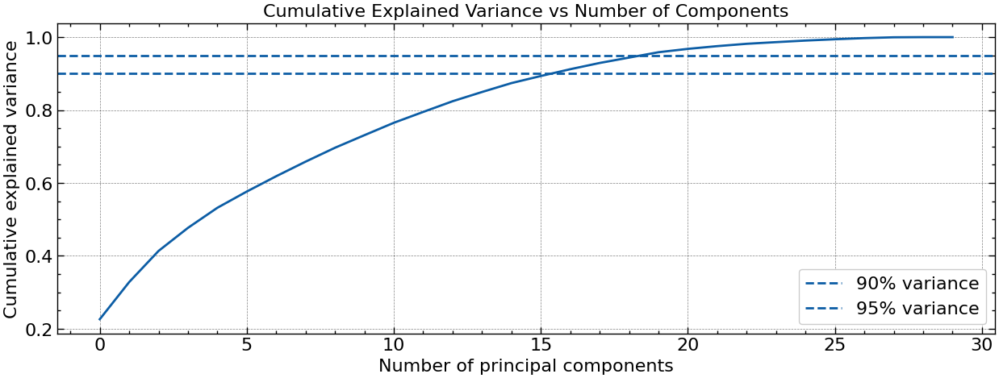

In [6]:
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science','notebook', 'grid'])

plt.figure(figsize=(15, 5))
plt.plot(cumulative_variance, lw=2)
plt.axhline(0.90, linestyle='--', label='90% variance')
plt.axhline(0.95, linestyle='--', label='95% variance')
plt.xlabel('Number of principal components')
plt.ylabel('Cumulative explained variance')
plt.title('Cumulative Explained Variance vs Number of Components')
plt.legend()
plt.grid(True)
plt.show()

The cumulative explained variance curve shows that a relatively small number of principal components is sufficient to capture a large fraction of the total variance. This behavior reflects the presence of significant correlations among the input observables, which is expected in particle physics datasets where many features are derived from related kinematic quantities. Importantly, while retaining a large fraction of the variance may suggest an effective dimensionality lower than the original feature space, variance preservation alone does not guarantee optimal class discrimination.

### **5.2 Choosing the Number of Components**

From an exploratory standpoint, one may choose the number of principal components based on a cumulative variance threshold, such as retaining 90% or 95% of the total variance.

Such criteria provide a principled and interpretable heuristic for dimensionality reduction while controlling information loss. However, this choice remains application-dependent and should be guided by the intended downstream use of the representation.

In the context of this notebook, no hard dimensionality reduction is enforced at this stage. Instead, the explained variance analysis is used to build intuition about feature redundancy and correlation structure, rather than to define a reduced feature set for classification.

## **6. Visualization in PCA Space**
### **6.1 2D Projection**

To visualize the dominant structure of the dataset, we project each event onto the first two principal components. Although PCA is unsupervised, we color the points by their class label to assess whether any natural separation emerges in the reduced space. We also annotate axis labels with the explained variance captured by each component.


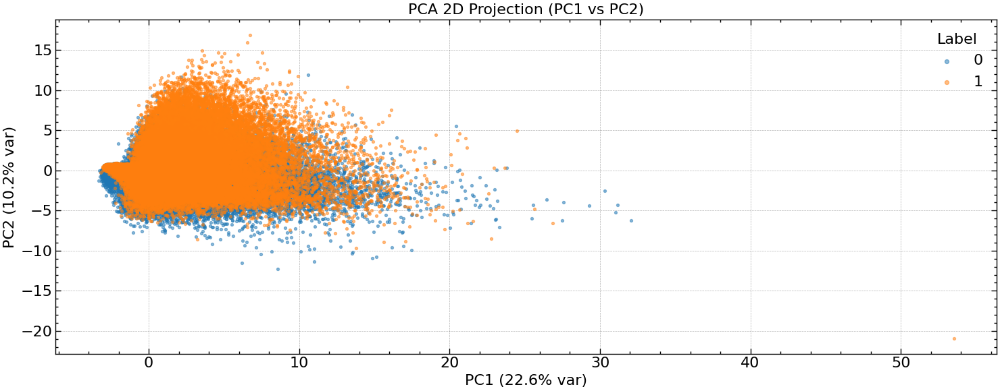

In [7]:
# Use the first two principal components
pc1, pc2 = X_pca[:, 0], X_pca[:, 1]
var_pct = pca.explained_variance_ratio_ * 100

# Map labels to colors with a stable order (common HEP labels: b=background, s=signal)
labels = np.array(y)
if labels.dtype.kind in 'OUS':
    preferred = ['b', 's']
    unique_labels = [l for l in preferred if l in labels] + [l for l in np.unique(labels) if l not in preferred]
else:
    unique_labels = list(np.unique(labels))

cmap = plt.get_cmap('tab10')
colors = [cmap(i) for i in range(len(unique_labels))]

plt.figure(figsize=(15, 6))
for lab, col in zip(unique_labels, colors):
    mask = labels == lab
    plt.scatter(pc1[mask], pc2[mask], s=8, alpha=0.5, label=str(lab), c=[col], rasterized=True)

plt.xlabel(f'PC1 ({var_pct[0]:.1f}% var)')
plt.ylabel(f'PC2 ({var_pct[1]:.1f}% var)')
plt.title('PCA 2D Projection (PC1 vs PC2)')
plt.legend(title='Label', frameon=False, markerscale=1.5)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


The two-dimensional PCA projection (PC1 vs PC2) shows substantial overlap between signal and background events, even after data cleaning and standardization. While minor differences in density and tail structure are visible, no robust separation emerges in the subspace spanned by the leading principal components. This indicates that the dominant variance directions encode shared physical structure rather than class-discriminative information.

### **6.2 3D Projection**

A 3D projection can reveal additional structure that may not be visible in the 2D plane. We therefore visualize the first three principal components, again coloring by class label and showing the explained variance on each axis. Any visible clustering should be interpreted cautiously, as PCA maximizes variance rather than class separation.

In [8]:
import plotly.graph_objects as go

def plot_interactive_pca_3d(
    X_pca,
    pca,
    y,
    pcs=(0, 1, 2),
    max_points=200_000,
    random_state=7,
    title_prefix="Interactive PCA 3D Projection"
):
    """
    Interactive 3D visualization of selected PCA components.

    Parameters
    ----------
    X_pca : ndarray, shape (n_samples, n_components)
        PCA-transformed data.
    pca : fitted sklearn PCA object
        Used to extract explained variance ratios.
    y : array-like
        Class labels.
    pcs : tuple of int, default (0, 1, 2)
        Indices of principal components to plot (0-based).
    max_points : int, default 200_000
        Maximum number of points to display (for responsiveness).
    random_state : int, default 7
        Random seed for subsampling.
    title_prefix : str
        Prefix for the plot title.
    """

    pcx, pcy, pcz = (X_pca[:, pcs[0]],
                     X_pca[:, pcs[1]],
                     X_pca[:, pcs[2]])

    var_pct = pca.explained_variance_ratio_ * 100
    labels = np.array(y)

    # Stable label ordering (HEP-friendly)
    if labels.dtype.kind in 'OUS':
        preferred = ['b', 's']
        unique_labels = (
            [l for l in preferred if l in labels] +
            [l for l in np.unique(labels) if l not in preferred]
        )
    else:
        unique_labels = list(np.unique(labels))

    # Optional subsampling
    rng = np.random.default_rng(random_state)
    if len(pcx) > max_points:
        idx = rng.choice(len(pcx), size=max_points, replace=False)
        pcx, pcy, pcz = pcx[idx], pcy[idx], pcz[idx]
        labels = labels[idx]

    fig = go.Figure()
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

    for i, lab in enumerate(unique_labels):
        mask = labels == lab
        fig.add_trace(
            go.Scatter3d(
                x=pcx[mask],
                y=pcy[mask],
                z=pcz[mask],
                mode='markers',
                name=str(lab),
                marker=dict(
                    size=3,
                    opacity=0.55,
                    color=colors[i % len(colors)]
                )
            )
        )

    fig.update_layout(
        title=f"{title_prefix} (PC{pcs[0]+1} vs PC{pcs[1]+1} vs PC{pcs[2]+1})",
        scene=dict(
            xaxis_title=f"PC{pcs[0]+1} ({var_pct[pcs[0]]:.1f}% var)",
            yaxis_title=f"PC{pcs[1]+1} ({var_pct[pcs[1]]:.1f}% var)",
            zaxis_title=f"PC{pcs[2]+1} ({var_pct[pcs[2]]:.1f}% var)",
        ),
        legend_title="Label",
        margin=dict(l=0, r=0, t=40, b=0),
    )

    fig.show()


In [9]:
plot_interactive_pca_3d(X_pca, pca, y)

**Even after careful data cleaning, imputation, and feature standardization**, the 3D PCA projection shows that, although the first few principal components capture a large fraction of the total variance, they do not provide strong or stable class separation between signal and background. This indicates that the dominant sources of variance in the dataset are not aligned with the most discriminative directions, a situation commonly encountered in high-energy physics analyses.

From certain viewing angles, a mild front–back ordering of events can be observed; however, this apparent structure is highly view-dependent and does not persist under rotation. Consequently, it does not constitute evidence of genuine class separation, but rather reflects projection effects

In [10]:
plot_interactive_pca_3d(
    X_pca, pca, y,
    pcs=(1, 2, 3)
)

As an additional check, we visualize the data in the subspace spanned by PC2–PC4, excluding the leading principal component. The resulting projection shows an even stronger overlap between signal and background events, indicating that the dominant variance direction does not encode discriminative structure. This further confirms that variance-based representations alone are insufficient for class separation in this dataset.

## **7. PCA and Class Structure**
### **7.1 Unsupervised nature of PCA**

Principal Component Analysis (PCA) is an unsupervised dimensionality reduction technique, meaning that it does not incorporate class labels or target information during the construction of the principal components.

The directions identified by PCA are solely determined by the covariance structure of the input features and are chosen to maximize the total variance of the data. As a result, PCA is inherently agnostic to any notion of class separation or discriminative relevance.

In the context of event classification, this implies that the leading principal components capture dominant sources of variability in the dataset, which may arise from kinematic scales, detector effects, or correlated observables, rather than features that optimally distinguish signal from background.

### **7.2 Variance vs discrimination**

While PCA orders components by decreasing explained variance, high variance does not necessarily imply high discriminative power. Directions that dominate the variance of the dataset may correspond to shared physical structure between signal and background events, rather than class-specific characteristics.

The PCA projections presented in this analysis demonstrate that, although the first few principal components capture a substantial fraction of the total variance, they do not yield strong or robust separation between signal and background classes. Even when excluding the leading component and examining subspaces such as PC2–PC4, any apparent ordering or partial separation is highly view-dependent and does not persist under rotation.

This highlights a fundamental limitation of variance-based representations for classification tasks: maximizing variance and maximizing class separability are, in general, distinct objectives. Consequently, PCA alone is insufficient as a discriminative tool in this setting and should be interpreted primarily as a means of understanding feature correlations and intrinsic data structure.

## **8. Role of PCA in the Full Analysis Pipeline**
### **8.1 PCA as preprocessing**

Within the full analysis pipeline, PCA is employed as an exploratory and diagnostic preprocessing step rather than as a standalone dimensionality reduction method for classification.

The primary roles of PCA in this study are:
- To reveal correlations and redundancies among the input observables.
- To assess the effective dimensionality of the feature space.
- To visualize the global structure of signal and background events in low-dimensional projections.
- To motivate the use of supervised learning methods capable of identifying discriminative directions that are not aligned with maximal variance.

Based on the observed overlap between classes in PCA space, no hard dimensionality reduction is applied at this stage. Instead, the full standardized feature set is retained for subsequent supervised classifiers, which can explicitly optimize class separation using label information.

### **8.2 Motivation for supervised classifiers**

From a practical point of view, dimensionality reduction helps mitigate the challenges of working with high-dimensional feature spaces. Although models such as **Support Vector Machines (SVMs)** can achieve strong discrimination performance, their effectiveness in high dimensions is often limited by computational scaling and by the **curse of dimensionality**.

As discussed in *Hands-On Machine Learning with Scikit-Learn and PyTorch* (Chapter 7), high-dimensional datasets tend to become sparse, which reduces the reliability of distance-based reasoning and increases the risk of overfitting. This motivates the use of dimensionality reduction techniques and simple, interpretable baseline models before applying more complex supervised classifiers.

In this analysis, **PCA** is used as a diagnostic and representational tool to study correlations and redundancies in the feature space, rather than as a classifier.

### **8.3 Transition to SVM**

The PCA analysis demonstrates that the dominant sources of variance in the dataset are not strongly correlated with class separation. This motivates the use of supervised learning methods capable of identifying discriminative directions that are not captured by unsupervised variance maximization.

Support Vector Machines (SVMs) are particularly well-suited for this task, as they explicitly construct decision boundaries that maximize class separation rather than data variance. By operating in the original standardized feature space, SVMs can exploit subtle combinations of observables that may be weakly informative individually but jointly discriminative.

In the next stage of the analysis, SVMs are introduced as a more expressive supervised classifier. The insights gained from PCA—regarding feature correlations, effective dimensionality, and the limitations of linear variance-based projections—provide essential context for interpreting the behavior and performance of the SVM models.

## **9. Limitations of PCA in Particle Physics**

In high-dimensional feature spaces, many intuitive geometric notions break down. As discussed in the machine learning literature, the average distance between data points increases rapidly with dimensionality, leading to sparse data representations and reduced effectiveness of distance-based reasoning.

This phenomenon, commonly referred to as the *curse of dimensionality*, implies that high-dimensional datasets require exponentially more samples to achieve a comparable density to low-dimensional spaces. As a result, identifying meaningful structures and correlations becomes increasingly challenging.

In the context of particle physics analyses, where many observables are derived from related kinematic quantities, dimensionality reduction techniques such as PCA provide a principled way to mitigate these effects by revealing dominant correlation patterns in the data, while suppressing redundant or noisy directions in feature space.

This discussion is consistent with standard treatments of high-dimensional data in machine learning **( see e.g. *Hands-On Machine Learning with Scikit-Learn, and PyTorch. Chapter: 7* )**.


## **10. Conclusion**

In this notebook, Principal Component Analysis (PCA) was used as an exploratory and representational tool to study the structure of a high-dimensional particle physics dataset.

The analysis showed that, although the first few principal components capture a substantial fraction of the total variance, the resulting low-dimensional projections do not yield robust separation between signal and background events. Apparent ordering or partial separation observed in certain projections was found to be strongly view-dependent and did not persist under rotation, highlighting the limitations of variance-based representations for classification tasks.

This behavior reflects the unsupervised nature of PCA: the directions of maximal variance are not necessarily aligned with the directions that maximize class discrimination. In this dataset, dominant sources of variance are likely associated with shared physical structure, correlated kinematic quantities, or detector effects, rather than class-specific features.

Consequently, PCA alone is insufficient as a discriminative method for event classification in this setting. Its primary value lies in diagnosing correlations, redundancies, and effective dimensionality, as well as motivating the use of supervised learning methods capable of explicitly optimizing class separation.

In the next stage of the analysis, supervised classifiers—specifically Support Vector Machines—are introduced to identify discriminative directions in the original standardized feature space, guided by the insights obtained from this PCA-based exploration.
